In [112]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

Importing dataset CSV files X_train_update and y_train_CVw08PX

In [113]:
df1 = pd.read_csv("X_train_update.csv", encoding= 'latin-1')
df2 = pd.read_csv("Y_train_CVw08PX.csv", encoding= 'latin-1')
df3 = pd.read_csv("X_test_update.csv", encoding= 'latin-1')

Display DataFrame summary information of df1(X_train_update)

In [114]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84916 entries, 0 to 84915
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Unnamed: 0   84916 non-null  int64 
 1   designation  84916 non-null  object
 2   description  55116 non-null  object
 3   productid    84916 non-null  int64 
 4   imageid      84916 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 3.2+ MB


Display DataFrame summary information of df2 (y_train-CVw08PX)

In [115]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84916 entries, 0 to 84915
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   Unnamed: 0   84916 non-null  int64
 1   prdtypecode  84916 non-null  int64
dtypes: int64(2)
memory usage: 1.3 MB


Display DataFrame summary information of df1(X_test_update)

In [116]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13812 entries, 0 to 13811
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Unnamed: 0   13812 non-null  int64 
 1   designation  13812 non-null  object
 2   description  8926 non-null   object
 3   productid    13812 non-null  int64 
 4   imageid      13812 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 539.7+ KB


Display the first few lines of df1 (X_train_update file)


In [117]:
df1.head()

,Unnamed: 0,designation,description,productid,imageid
0,0,Olivia: Personalisiertes Notizbuch / 150 Seite...,NaN,3804725264,1263597046
1,1,Journal Des Arts (Le) NÂ° 133 Du 28/09/2001 - ...,NaN,436067568,1008141237
2,2,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,PILOT STYLE Touch Pen de marque Speedlink est ...,201115110,938777978
3,3,Peluche Donald - Europe - Disneyland 2000 (Mar...,NaN,50418756,457047496
4,4,La Guerre Des Tuques,Luc a des id&eacute;es de grandeur. Il veut or...,278535884,1077757786


Display the first few lines of (y_train-CVw08PX)

In [118]:
df2.head()

,Unnamed: 0,prdtypecode
0,0,10
1,1,2280
2,2,50
3,3,1280
4,4,2705


To find the data from x_test is present in x_train

In [119]:
df3['present in x_train'] = df3['productid'].isin(df1['productid'])
df3['present in x_train'].unique()

#x_test has no samples from x_train. Both are different

array([False])

Both df1 and df2 share a common column 'Unnamed: 0', and the total number of columns is the same. To merge df1 and df2 on the common column 'Unnamed: 0'

In [120]:
train = df1.merge(df2, how='left', on='Unnamed: 0')
train.head()

,Unnamed: 0,designation,description,productid,imageid,prdtypecode
0,0,Olivia: Personalisiertes Notizbuch / 150 Seite...,NaN,3804725264,1263597046,10
1,1,Journal Des Arts (Le) NÂ° 133 Du 28/09/2001 - ...,NaN,436067568,1008141237,2280
2,2,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,PILOT STYLE Touch Pen de marque Speedlink est ...,201115110,938777978,50
3,3,Peluche Donald - Europe - Disneyland 2000 (Mar...,NaN,50418756,457047496,1280
4,4,La Guerre Des Tuques,Luc a des id&eacute;es de grandeur. Il veut or...,278535884,1077757786,2705


In [121]:
train.to_csv("Text_train_prdtypecode.csv")

Display DataFrame summary information of train set

In [122]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84916 entries, 0 to 84915
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Unnamed: 0   84916 non-null  int64 
 1   designation  84916 non-null  object
 2   description  55116 non-null  object
 3   productid    84916 non-null  int64 
 4   imageid      84916 non-null  int64 
 5   prdtypecode  84916 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 3.9+ MB


In [123]:
train.isna().sum()

Unnamed: 0         0
designation        0
description    29800
productid          0
imageid            0
prdtypecode        0
dtype: int64

In [124]:
train.isna().mean()

Unnamed: 0     0.000000
designation    0.000000
description    0.350935
productid      0.000000
imageid        0.000000
prdtypecode    0.000000
dtype: float64

The Dataframe contains 29800 missing values in description column. Some product do not have description (Not all the merchant use this field. So, we cannot remove it from the dataframe) but they have designation(product title and short summary) and imageid. 

Finding duplicates in product id

In [125]:
duplicates = train.duplicated().sum()
print(duplicates)
#No duplicates found in the train dataframe

0


Duplicate 'prdtypecode' column and rename the column name with 'product_category' 

Replace product codes in 'product_category' column with generalized category names

We collected information about product category for each prdtypecode from Rakuten France website

In [126]:
train = train.assign(product_category = train.prdtypecode)
train['product_category'] = train["product_category"].replace({ 10: "Used books",
                                                               2280: "Used Newspapers and magazines",
                                                               2403: "Books, comics, and magazines",
                                                               2522: "Office supplies and stationery accessories",
                                                               2705: "New books",
                                                               40: "Video games, CDs, equipment, cables, new",
                                                               50: "Gaming accessories",
                                                               60: "Game consoles",
                                                               2462: "Used video games",
                                                               2905: "PC video games",
                                                               1140: "Figurines, pop culture items",
                                                               1180: "Trading cards",
                                                               1160: "Board games and role-playing games",
                                                               1280: "Children's toys",
                                                               1260: "Children's board games",
                                                               1281: "Model kits",
                                                               1300: "Modeling",
                                                               1325: "Outdoor games, air games, clothing",
                                                               1560: "General furniture: beds, mattresses, sofas, chairs",
                                                               2582: "Garden furniture: furniture and tools for the garden",
                                                               1320: "Childcare, baby accessories",
                                                               2567: "Pet supplies",
                                                               2583: "Pool and accessories",
                                                               2588: "Garden tools, outdoor technical equipment, house and pool accessories",
                                                               1325: "Home linens, pillows, cushions",
                                                               2560: "Decoration",
                                                               1301: "Baby socks, small photos",
                                                               1940: "Confectionery",
                                                               2060: "Decoration",
                                                               1920: "Household linen, pillows, cushions",
                                                               2585: "Garden tools, Outdoor technical equipment for homes and swimming pools",
                                                               1302: "Outdoor games, clothes",
                                                               2220: "Pet store"})


In [127]:
product_counts = train.product_category.value_counts().sort_values(ascending=False).reset_index()
#product_counts = pd.DataFrame(product_counts).rename(columns={'prdtypecode': 'Product code'})
product_counts

,product_category,count
0,Pool and accessories,10209
1,"General furniture: beds, mattresses, sofas, ch...",5073
2,Modeling,5045
3,Decoration,4993
4,Office supplies and stationery accessories,4989
5,Children's toys,4870
6,"Books, comics, and magazines",4774
7,Used Newspapers and magazines,4760
8,"Household linen, pillows, cushions",4303
9,Board games and role-playing games,3953


Categorical distribution of products

C:\Users\PC\AppData\Local\Temp\ipykernel_16428\1066656309.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




Text(0.5, 1.0, 'Distribution of Product Type Codes')

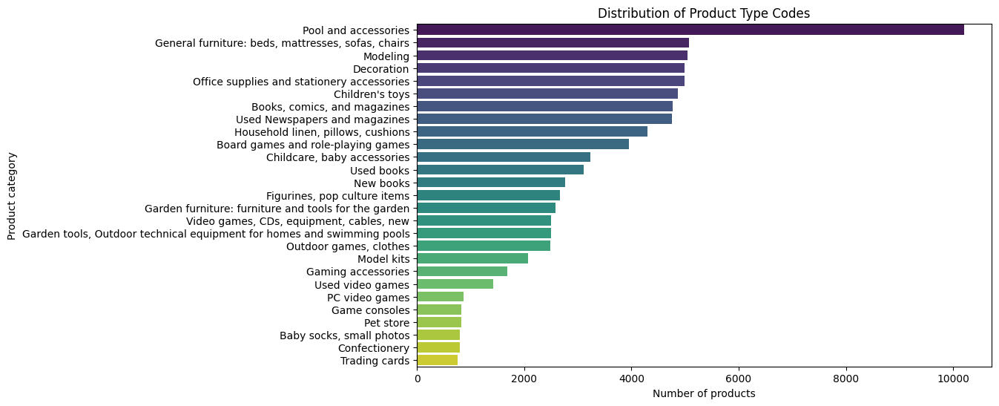

In [128]:
import seaborn as sns

category_order = train['product_category'].value_counts().index

plt.figure(figsize=(10,6))
sns.countplot(y='product_category', data=train, palette="viridis", order = category_order)
plt.xlabel("Number of products")
plt.ylabel("Product category")
plt.title('Distribution of Product Type Codes')


Creating a column 'designation_length' contains number of characters in the designation for each product

Calcualte the average number of characters in each product category

C:\Users\PC\AppData\Local\Temp\ipykernel_16428\4105812541.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




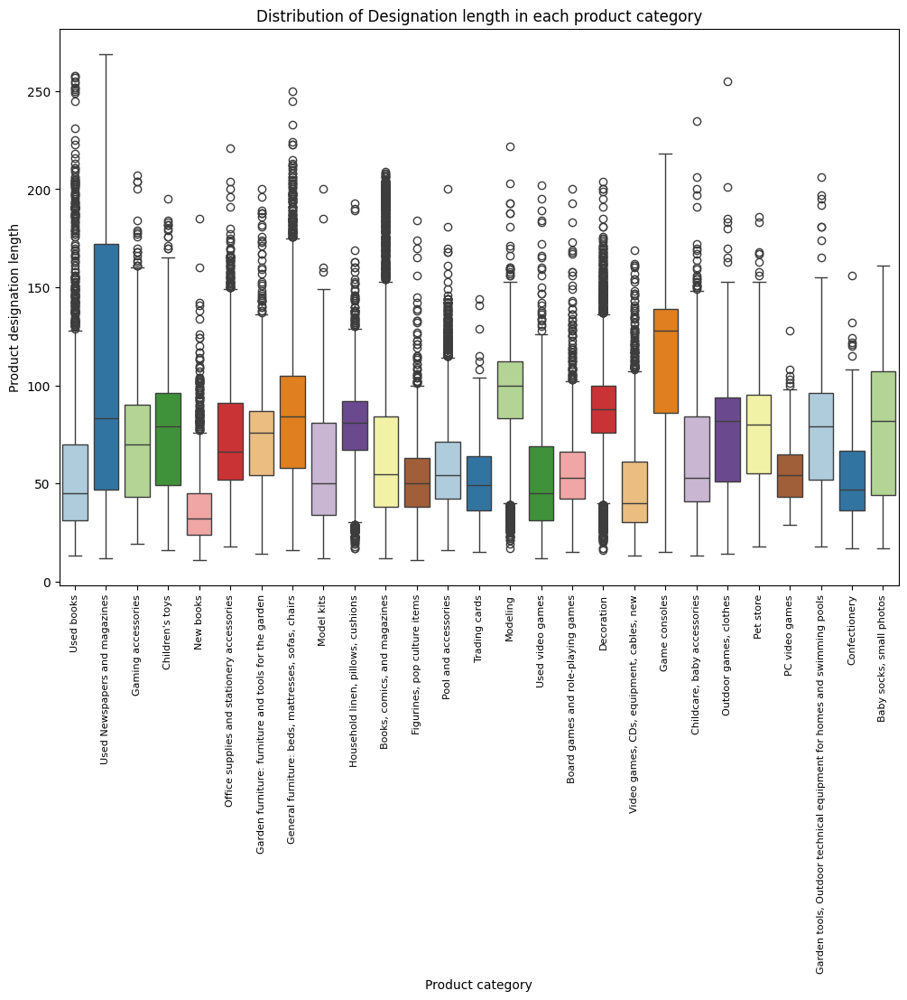

In [129]:
train['designation_length'] = train['designation'].apply(lambda x: len(str(x)))

#Box plot
plt.figure(figsize = (12, 8))
sns.boxplot (x = "product_category", y = "designation_length",  data = train, palette='Paired')
plt.xticks(rotation=90, fontsize=8)
plt.title("Distribution of Designation length in each product category")
plt.xlabel("Product category")
plt.ylabel("Product designation length")
plt.show()

1. Product category "Games consoles" has longest designation length (high median value) with least outlier (i.e., 1) among other products. 
2. Product category "Used newspaper and magazines" contains wide range of designation length
3. Product category "Used Books" have smaller median but also have larger variance (outliers) upto 250 characters length
4. Product category "New Books" has minimum characters in designation

Creating a column 'description_length' contains number of characters in the designation for each product

C:\Users\PC\AppData\Local\Temp\ipykernel_16428\2686485607.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




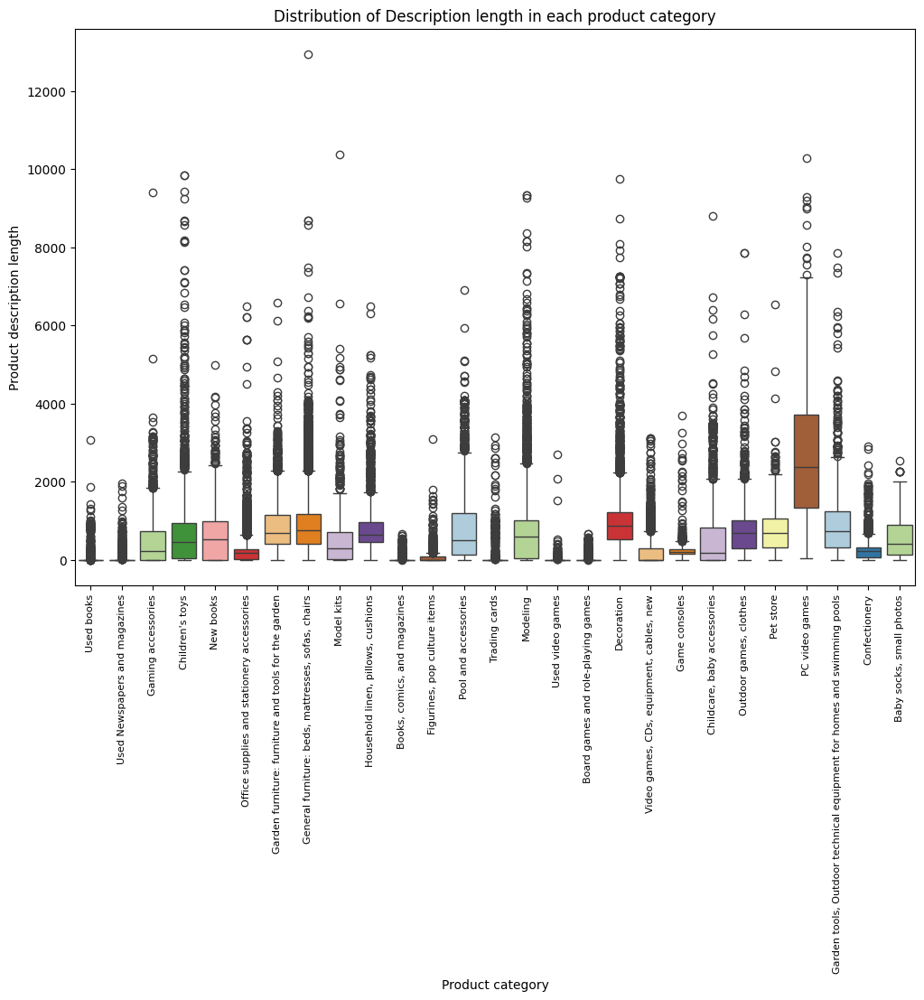

In [130]:
train['description_length'] = train['description'].apply(lambda x: len(str(x)))

#Box plot

plt.figure(figsize = (12, 8))
sns.boxplot (x = "product_category", y = "description_length",  data = train, palette='Paired')
plt.xticks(rotation=90, fontsize=8)
plt.title("Distribution of Description length in each product category")
plt.xlabel("Product category")
plt.ylabel("Product description length")
plt.show()

Finding products with description

In [131]:
#Creating a column 'has description' which holds True=with description and False=without description
train['has_description'] = train['description'].notna().astype(int)
description_counts = train.groupby(['product_category', 'has_description']).size().reset_index(name='count')
total_count = train.groupby('product_category').size().reset_index(name='total_count')
description_counts = description_counts.merge(total_count, on='product_category')
description_counts['percentage'] = description_counts['count'] / description_counts['total_count']
description_counts['has_description'] = description_counts['has_description'].replace({0: 'No Description', 1: 'With Description'})
description_counts

,product_category,has_description,count,total_count,percentage
0,"Baby socks, small photos",No Description,105,807,0.130112
1,"Baby socks, small photos",With Description,702,807,0.869888
2,Board games and role-playing games,No Description,3604,3953,0.911713
3,Board games and role-playing games,With Description,349,3953,0.088287
4,"Books, comics, and magazines",No Description,4648,4774,0.973607
5,"Books, comics, and magazines",With Description,126,4774,0.026393
6,"Childcare, baby accessories",No Description,1101,3241,0.339710
7,"Childcare, baby accessories",With Description,2140,3241,0.660290
8,Children's toys,No Description,1068,4870,0.219302
9,Children's toys,With Description,3802,4870,0.780698


Ploting the distribution of description in product categories

In [132]:
# Replace 'has_description' values: 0 -> 'No Description', 1 -> 'With Description'
description_counts['has_description'] = description_counts['has_description'].replace({0: 'No Description', 1: 'With Description'})

#Bar plot
import plotly.express as px

fig = px.bar(description_counts,
             x='percentage',
             y='product_category',
             color='has_description',
             title='Proportion of products with and without Description',
             labels={'count': 'Number of Products', 'product_category': 'Product Categories'},
             color_discrete_map={'No Description': 'red', 'With Description': 'green'},
             width=1000,
             height=600)

fig.update_layout(barmode='stack',
                  xaxis_title='Product Categories',
                  yaxis_title='Proportion of Products (%)',
                  legend_title='Description Status',
                  title_x= 0.5)

fig.show()

1. PC Video Games category has description for all of its product
2. Books, comics and magazines category and used video games category has least number of descriptions for its product

Importing image dataset with extracted informations from images

In [ ]:
df_image_data = pd.read_csv("C:/Users/PC/Desktop/Bala/Datascientest/Rakuton/project/Github/notebooks/Exploratory analysis/df_image_data_20241024.csv", encoding= 'latin-1') 
#This dataset is generated with image processing.ipynb file, refer src > features in github
df_image_data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84916 entries, 0 to 84915
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       84916 non-null  int64  
 1   image_name       84916 non-null  object 
 2   image_path       84916 non-null  object 
 3   productid        84916 non-null  int64  
 4   imageid          84916 non-null  int64  
 5   sharpness_score  84916 non-null  float64
 6   image_quality    84916 non-null  object 
 7   image_dimension  84916 non-null  object 
 8   extracted_text   18744 non-null  object 
 9   width            84916 non-null  int64  
 10  height           84916 non-null  int64  
 11  aspect_ratio     84916 non-null  float64
 12  image_is_blank   84916 non-null  bool   
dtypes: bool(1), float64(2), int64(5), object(5)
memory usage: 7.9+ MB


Merge of Image dataframe and Train dataframe (text dataframe)

In [134]:
train_merged = pd.merge(train, df_image_data, how='left', on='productid')
train_merged.head()

,Unnamed: 0_x,designation,description,productid,imageid_x,prdtypecode,product_category,designation_length,description_length,has_description,...,image_path,imageid_y,sharpness_score,image_quality,image_dimension,extracted_text,width,height,aspect_ratio,image_is_blank
0,0,Olivia: Personalisiertes Notizbuch / 150 Seite...,NaN,3804725264,1263597046,10,Used books,88,3,0,...,C:/Users/PC/Desktop/Bala/Datascientest/Rakuton...,1263597046,13614.66,Sharp,"(135, 202)","egÃ¢ÂÂ,",135,202,0.668317,False
1,1,Journal Des Arts (Le) NÂ° 133 Du 28/09/2001 - ...,NaN,436067568,1008141237,2280,Used Newspapers and magazines,207,3,0,...,C:/Users/PC/Desktop/Bala/Datascientest/Rakuton...,1008141237,4237.33,Sharp,"(180, 262)",= a |\ni -\n\nÃ¢ÂÂ_,180,262,0.687023,False
2,2,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,PILOT STYLE Touch Pen de marque Speedlink est ...,201115110,938777978,50,Gaming accessories,76,780,1,...,C:/Users/PC/Desktop/Bala/Datascientest/Rakuton...,938777978,110.18,Blurry,"(349, 362)",NaN,349,362,0.964088,False
3,3,Peluche Donald - Europe - Disneyland 2000 (Mar...,NaN,50418756,457047496,1280,Children's toys,64,3,0,...,C:/Users/PC/Desktop/Bala/Datascientest/Rakuton...,457047496,631.21,Sharp,"(333, 385)",NaN,333,385,0.864935,False
4,4,La Guerre Des Tuques,Luc a des id&eacute;es de grandeur. Il veut or...,278535884,1077757786,2705,New books,20,213,1,...,C:/Users/PC/Desktop/Bala/Datascientest/Rakuton...,1077757786,8105.96,Sharp,"(180, 301)",NaN,180,301,0.598007,False


Removing unwanted and duplicated columns after merging

In [135]:
train_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84916 entries, 0 to 84915
Data columns (total 22 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Unnamed: 0_x        84916 non-null  int64  
 1   designation         84916 non-null  object 
 2   description         55116 non-null  object 
 3   productid           84916 non-null  int64  
 4   imageid_x           84916 non-null  int64  
 5   prdtypecode         84916 non-null  int64  
 6   product_category    84916 non-null  object 
 7   designation_length  84916 non-null  int64  
 8   description_length  84916 non-null  int64  
 9   has_description     84916 non-null  int32  
 10  Unnamed: 0_y        84916 non-null  int64  
 11  image_name          84916 non-null  object 
 12  image_path          84916 non-null  object 
 13  imageid_y           84916 non-null  int64  
 14  sharpness_score     84916 non-null  float64
 15  image_quality       84916 non-null  object 
 16  imag

In [136]:
train_merged.drop(['Unnamed: 0_y', 'imageid_y','image_quality'], axis=1, inplace=True)
train_merged.rename(columns={'imageid_x':'imageid','Unnamed: 0_x':'index'}, inplace=True)
train_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84916 entries, 0 to 84915
Data columns (total 19 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   index               84916 non-null  int64  
 1   designation         84916 non-null  object 
 2   description         55116 non-null  object 
 3   productid           84916 non-null  int64  
 4   imageid             84916 non-null  int64  
 5   prdtypecode         84916 non-null  int64  
 6   product_category    84916 non-null  object 
 7   designation_length  84916 non-null  int64  
 8   description_length  84916 non-null  int64  
 9   has_description     84916 non-null  int32  
 10  image_name          84916 non-null  object 
 11  image_path          84916 non-null  object 
 12  sharpness_score     84916 non-null  float64
 13  image_dimension     84916 non-null  object 
 14  extracted_text      18744 non-null  object 
 15  width               84916 non-null  int64  
 16  heig

Proportion of blank or no image in each product category

In [137]:
train_merged['image_is_blank'] = train_merged['image_is_blank'].apply(lambda x: 1 if x is True else 0)
image_counts = train_merged.groupby(['product_category', 'image_is_blank']).size().unstack(fill_value=0)

#Creating a long format dataframe and replace 0 and 1s with description
image_present = image_counts.reset_index().melt(id_vars='product_category',
                                                var_name='image_is_blank', 
                                                value_name='count')

image_present['image_is_blank'] = image_present['image_is_blank'].replace({0: 'Image is present', 1: 'Image is blank'})

In [138]:
#To create Pie chart showing the products with and without image
#we need total count of products and blank images
total_images = image_present['count'].sum()
blank_images = image_present[image_present['image_is_blank'] == 'Image is blank']['count'].sum()
print("Total product count is", total_images, "\nNumber of images with blank or solid background is", blank_images)

# count blank or solid background images by category
blank_by_category = image_present[image_present['image_is_blank'] == 'Image is blank']

Total product count is 84916 
Number of images with blank or solid background is 7


In [139]:
# Pie chart and bar plot to show the proportion of blank or solid background images in each category
import plotly.express as px
import plotly.graph_objects as go

#Creating pie chart
fig_pie = px.pie(values=[blank_images, total_images - blank_images],
                 names=['Blank Images', 'Non-Blank Images'],
                 title='Proportion of Blank Images from Total Images',
                 color_discrete_map={'Blank Images': '#FFA500', 'Non-Blank Images': '#008080'},
                 height=600)

fig_pie.show()

# Creating a bar chart for blank images by product category
fig_bar = px.bar(blank_by_category,
                 x='product_category',
                 y='count',
                 title='Number of Blank Images across Product Category',
                 labels={'count': 'Number of Blank Images', 'product_category': 'Product Category'},
                 color='image_is_blank',
                 color_discrete_map={'Image is blank': '#FFA500'},
                 width=1200,
                 height=600)
#fig_bar.update_xaxes(tickangle=90)

# Center the title for the bar chart
fig_bar.update_layout(title_x=0.5)

fig_bar.show()

Distribution of Product categories Image with and without text

In [140]:
train_merged['image_with_text'] = train_merged['extracted_text'].notna().astype(int)
image_with_text = train_merged.groupby(['product_category', 'image_with_text']).size().unstack(fill_value=0)

#Creating a long format dataframe and replace 0 and 1s with text in images
image_text = image_with_text.reset_index().melt(id_vars='product_category',
                                                var_name='image_with_text', 
                                                value_name='count')


image_text['image_with_text'] = image_text['image_with_text'].replace({0: 'Image without text', 1: 'Image with text'})

In [141]:
import plotly.express as px


# Creating the stacked bar plot using Plotly Express
fig = px.bar(image_text,
             x='product_category',
             y='count',
             color='image_with_text',
             title='Product images with and without text',
             labels={'count': 'Number of Products', 'product_category': 'Product Category'},
             color_discrete_map={0: 'lightblue', 1: 'yellow'},
             width=1000, height=800)

# Update layout to stack the bars and customize axis labels
fig.update_layout(barmode='stack',
                  xaxis_title='Product Categories',
                  yaxis_title='Number of Products',
                  legend_title='Textual image of products')

fig.update_xaxes(tickangle=90, tickfont= dict(size=12))

# Step 7: Show the plot
fig.show()

1. As expected, category New books have more text on images
2. Pet Store/ Baby socks, small photos category have least number of text on their product images

Sharpness with histogram for product sub catergory
Pie chart for sharpness distrbution of images

In [142]:
#Rounding off the sharpness score value
train_merged['sharpness_score']=round(train_merged['sharpness_score'], 0)

#Remove blank images from the dataframe
train_merged=train_merged[train_merged['image_is_blank']!=1]
train_merged['sharpness_score']=train_merged['sharpness_score'].astype('int')
train_merged['sharpness_score'].describe()

count    84909.000000
mean      1887.880708
std       2493.557766
min          0.000000
25%        495.000000
50%       1086.000000
75%       2323.000000
max      60466.000000
Name: sharpness_score, dtype: float64

In [143]:
#categorizing the sharpness into 4 categories
#Threshold
#Sharp: 200 - 500+
#Moderately Sharp: 100 - 200
#Slightly Blurry: 50 - 100
#Blurry: Below 50


def sharpness_category(sharpness_score):
    if sharpness_score >= 200:
        return 'Sharp'
    elif 200 > sharpness_score >= 100:
        return 'Moderately Sharp'
    elif 100 > sharpness_score >= 50:
        return 'Slightly Blurry'
    else:
        return 'Blurry'

train_merged['sharpness_category']=train_merged['sharpness_score'].apply(sharpness_category)

In [144]:
import plotly.graph_objects as go

# Get the image quality data (sharpness category distribution)
image_quality = train_merged['sharpness_category'].value_counts()

# Extract categories and values for the pie chart
image_quality_labels = image_quality.index
image_quality_values = image_quality.values

# Define colors for the pie chart segments
colors = ['lightblue', 'lightgreen', 'lightcoral', 'lightskyblue', 'lightpink', 'lightgoldenrodyellow', 'lightgray']

# Create the pie chart
fig = go.Figure(go.Pie(
    labels=image_quality_labels, 
    values=image_quality_values,
    marker_line=dict(width=2, color='black'),
    marker_colors=colors,
    pull=[0.2] + [0] * (len(image_quality_labels) - 1)  # Slightly pull out the first slice for emphasis
))

# Update layout for better presentation
fig.update_layout(
    title_text='Proportion of Images in Each Sharpness Category',
    width=800,  # Adjusted width for better visibility
    height=600,  # Adjusted height for better visibility
    showlegend=True  # Show legend to make it easier to identify categories
)

# Show the figure
fig.show()


C:\Users\PC\AppData\Local\Temp\ipykernel_16428\4182210318.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




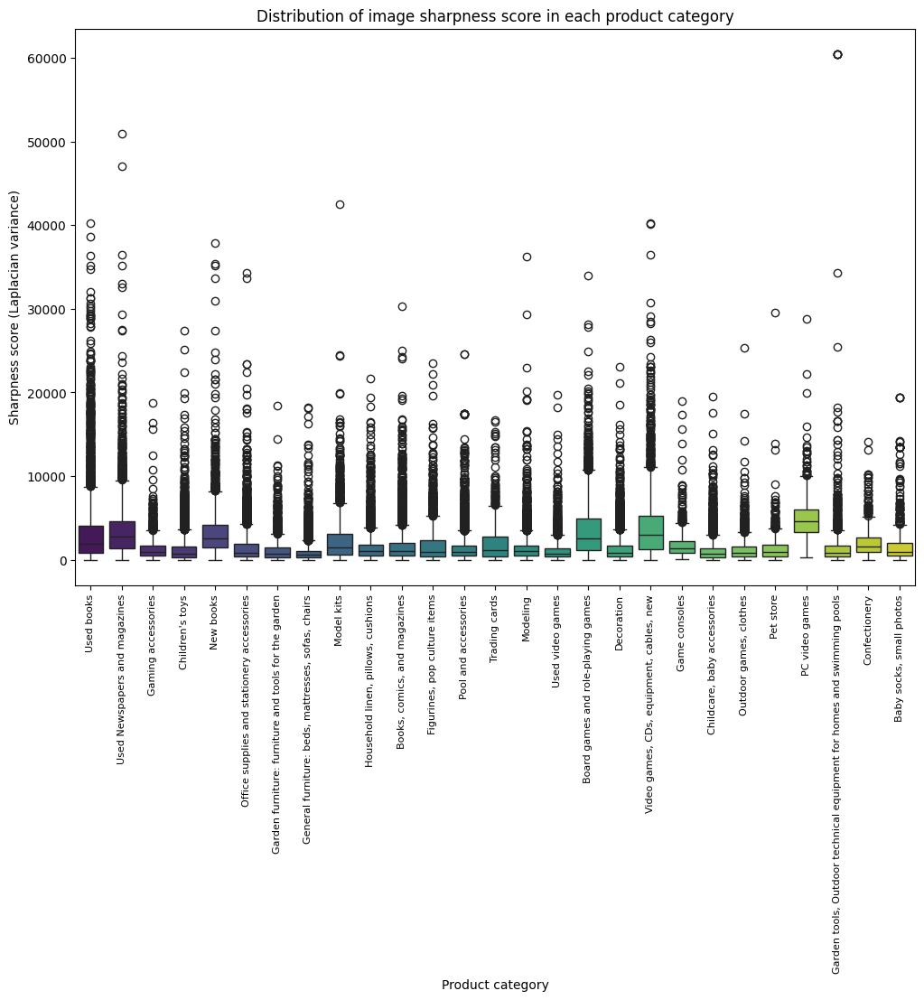

In [145]:
# plot box plot to see the distribution of image sharpness score in each product category

plt.figure(figsize = (12, 8))
sns.boxplot (x = "product_category", y = "sharpness_score",  data = train_merged, palette='viridis')
plt.xticks(rotation=90, fontsize=8)
plt.title("Distribution of image sharpness score in each product category")
plt.xlabel("Product category")
plt.ylabel("Sharpness score (Laplacian variance)")
plt.show()

Different image quality and its product category

In [146]:
#Best and worst image quality and its corresponding product category
minimum_image_quality = train_merged.iloc[train_merged['sharpness_score'].idxmin()]
maximum_image_quality = train_merged.iloc[train_merged['sharpness_score'].idxmax()]


print("Product image with lowest quality is from", minimum_image_quality['product_category'], 'product category' )
print("Product image with highest quality is from", maximum_image_quality['product_category'], 'product category' )

Product image with lowest quality is from Pool and accessories product category
Product image with highest quality is from Garden tools, Outdoor technical equipment for homes and swimming pools product category


In [147]:
#Product category with overall best and worst image quality 

sharpness_product = train_merged.groupby('product_category').agg({'sharpness_score':'median'})

print("Among the product category,", sharpness_product['sharpness_score'].idxmax(), "has the highest median image sharpness score")

print("Among the product category,", sharpness_product['sharpness_score'].idxmin(), "has the lowest median image sharpness score")
                                                                 

Among the product category, PC video games has the highest median image sharpness score
Among the product category, General furniture: beds, mattresses, sofas, chairs has the lowest median image sharpness score


Since some product do not have description, we merge designation and description columns 

In [148]:
train_merged['title_description'] = train_merged['designation'] + ' ' + train_merged['description'].fillna('')
train_merged.drop(columns=['designation', 'description'], axis=1, inplace=True)

The column 'title_description' is in French language, we translate them into English, before translating, the contents will be cleaned and preprocessed. 
The translation of the column 'title_description' from train merged dataset is carried out in 'Text_translation.ipynb' file

Importing the file 'translated_text.csv' which contains the translated 'title_description' column.

In [ ]:
text = pd.read_csv('C:/Users/PC/Desktop/Bala/Datascientest/Rakuton/project/Github/notebooks/Exploratory analysis/translated_text.csv')
#The translated_test data is generated by Text_translated.ipynb file, refer src > features in github
text = text[['productid', 'description_english']]


In [150]:
text.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84916 entries, 0 to 84915
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   productid            84916 non-null  int64 
 1   description_english  84916 non-null  object
dtypes: int64(1), object(1)
memory usage: 1.3+ MB


Merging the train_merged dataframe with translated_description dataframe from 'translated_text.csv' file to merge the translated title_description

In [151]:
train = pd.merge(train_merged, text, how='left', on='productid')
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84909 entries, 0 to 84908
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   index                84909 non-null  int64  
 1   productid            84909 non-null  int64  
 2   imageid              84909 non-null  int64  
 3   prdtypecode          84909 non-null  int64  
 4   product_category     84909 non-null  object 
 5   designation_length   84909 non-null  int64  
 6   description_length   84909 non-null  int64  
 7   has_description      84909 non-null  int32  
 8   image_name           84909 non-null  object 
 9   image_path           84909 non-null  object 
 10  sharpness_score      84909 non-null  int32  
 11  image_dimension      84909 non-null  object 
 12  extracted_text       18744 non-null  object 
 13  width                84909 non-null  int64  
 14  height               84909 non-null  int64  
 15  aspect_ratio         84909 non-null 

Cleaning of description_english column in train data

Convert stings to lower case

In [152]:
train['description_english'] = train['description_english'].str.lower()

Removal of white spaces

In [153]:
train['description_english']  = train['description_english'].str.replace(r'[^\w\s]', '', regex=True)

Removal of punctuation & special characters

In [154]:
import re

def remove_punctuation(text):
    return re.sub(r'[^\w\s]', '', text)

train['description_english'] = train['description_english'].apply(remove_punctuation)

In [155]:
from bs4 import BeautifulSoup
import string
import pandas as pd
import re

def remove_html_tags(text):
    return re.sub(r'<.*?>', '', text)

# Apply the function to the column
train['description_english'] = train['description_english'].apply(remove_html_tags)

# Define the cleaning function
def is_latin_like(word):
    # A heuristic to identify Latin-like words
    return len(word) < 5 and re.match(r'^[a-zA-Z]+$', word)

def clean_column(text):
    # Use utf-8 directly without encoding/decoding
    text = str(text)  # Ensure the input is a string

    # Remove special characters (except spaces)
    cleaned_text = re.sub(r'[^a-zA-Z0-9\s]', '', text)

    # Remove Latin-like words using the heuristic
    cleaned_text = ' '.join(word for word in cleaned_text.split() if not is_latin_like(word))

    # Remove extra spaces
    cleaned_text = ' '.join(cleaned_text.split())

    return cleaned_text

# Step 4: Apply the cleaning function to the specified column
train['description_english'] = train['description_english'].apply(clean_column)

Tokenization

In [156]:
def simple_tokenize(text):
    return text.split()
train['word_tokens'] = train['description_english'].apply(simple_tokenize)

In [157]:
train.head()

,index,productid,imageid,prdtypecode,product_category,designation_length,description_length,has_description,image_name,image_path,...,extracted_text,width,height,aspect_ratio,image_is_blank,image_with_text,sharpness_category,title_description,description_english,word_tokens
0,0,3804725264,1263597046,10,Used books,88,3,0,image_1263597046_product_3804725264.jpg,C:/Users/PC/Desktop/Bala/Datascientest/Rakuton...,...,"egÃ¢ÂÂ,",135,202,0.668317,0,1,Sharp,Olivia: Personalisiertes Notizbuch / 150 Seite...,olivia personalized notebook 150 pages points ...,"[olivia, personalized, notebook, 150, pages, p..."
1,1,436067568,1008141237,2280,Used Newspapers and magazines,207,3,0,image_1008141237_product_436067568.jpg,C:/Users/PC/Desktop/Bala/Datascientest/Rakuton...,...,= a |\ni -\n\nÃ¢ÂÂ_,180,262,0.687023,0,1,Sharp,Journal Des Arts (Le) NÂ° 133 Du 28/09/2001 - ...,journal 133 28092001 asian salon salon paris j...,"[journal, 133, 28092001, asian, salon, salon, ..."
2,2,201115110,938777978,50,Gaming accessories,76,780,1,image_938777978_product_201115110.jpg,C:/Users/PC/Desktop/Bala/Datascientest/Rakuton...,...,NaN,349,362,0.964088,0,0,Moderately Sharp,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,large ergonomic gamepad nintendo speedlink pil...,"[large, ergonomic, gamepad, nintendo, speedlin..."
3,3,50418756,457047496,1280,Children's toys,64,3,0,image_457047496_product_50418756.jpg,C:/Users/PC/Desktop/Bala/Datascientest/Rakuton...,...,NaN,333,385,0.864935,0,0,Sharp,Peluche Donald - Europe - Disneyland 2000 (Mar...,donald europe disneyland 2000 finger puppet plush,"[donald, europe, disneyland, 2000, finger, pup..."
4,4,278535884,1077757786,2705,New books,20,213,1,image_1077757786_product_278535884.jpg,C:/Users/PC/Desktop/Bala/Datascientest/Rakuton...,...,NaN,180,301,0.598007,0,0,Sharp,La Guerre Des Tuques Luc a des id&eacute;es de...,tuques ideacutees grandeur wants organize ball...,"[tuques, ideacutees, grandeur, wants, organize..."


Removing stop words

In [158]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

stop_words = set(stopwords.words('english')) 

def remove_stop_words(text):
    words = text.split()
    filter_words=[word for word in words if word.lower() not in stop_words]
    return ' '.join(filter_words)

train['filtered_description']=train['description_english'].apply(remove_stop_words)

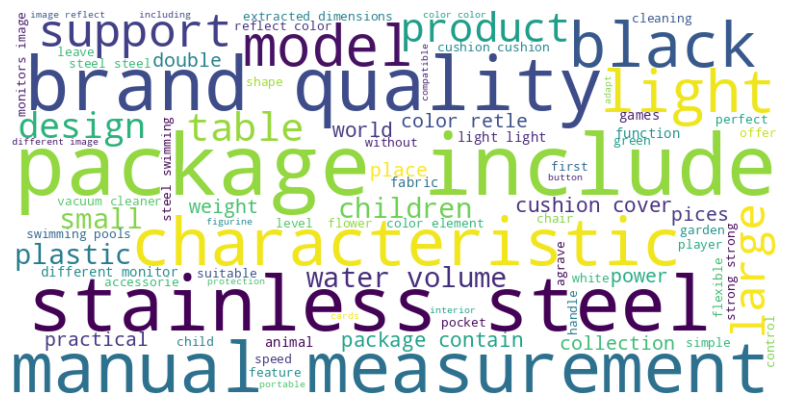

In [159]:
from wordcloud import WordCloud

wordcloud=WordCloud(width=800, height=400, background_color='white',colormap='viridis', max_words=200, min_font_size=10, max_font_size=100,contour_color='darkblue', 
                    contour_width=1).generate(''.join(train['filtered_description']))
plt.figure(figsize=(10,5))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

Frequent words in each product category

In [160]:
from collections import Counter

def count_words_by_category(df):
    word_counts = {}
    for category, group in df.groupby('product_category'):
        words = [word for sublist in group['word_tokens'] for word in sublist]
        word_counts[category] = Counter(words)
    return word_counts

word_frequencies = count_words_by_category(train)
word_frequencies

{'Baby socks, small photos': Counter({'socks': 786,
          'girls': 713,
          'length': 626,
          'quality': 600,
          'cotton': 599,
          '1': 548,
          'beautiful': 422,
          'cartoon': 407,
          'children': 406,
          'garons': 406,
          '100': 364,
          'brand': 287,
          'design': 261,
          'antislip': 234,
          'color': 230,
          'feeling': 228,
          'comfortable': 223,
          'table': 205,
          'information': 202,
          '3': 200,
          'product': 199,
          'months': 196,
          'characteristics': 193,
          'daily': 193,
          '12': 178,
          'available': 166,
          'matrians': 165,
          'years': 165,
          'prfet': 162,
          'singles': 159,
          'label': 159,
          'contents': 156,
          'matriages': 147,
          'charming': 141,
          'remove': 139,
          '13': 139,
          'light': 129,
          'balls': 129,
          '

WordCloud for each product category

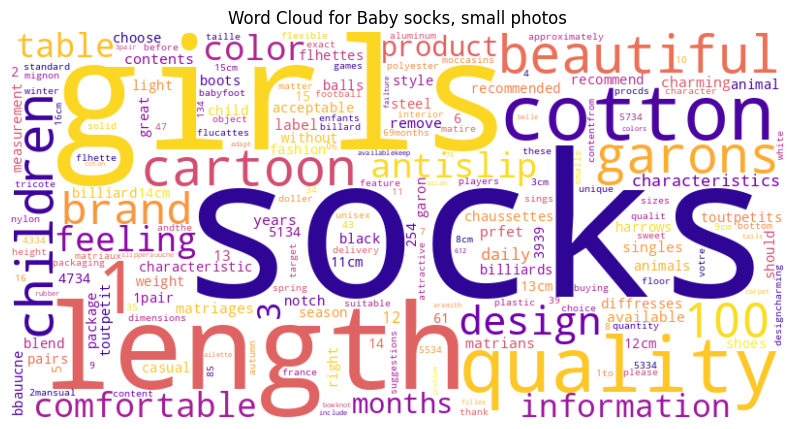

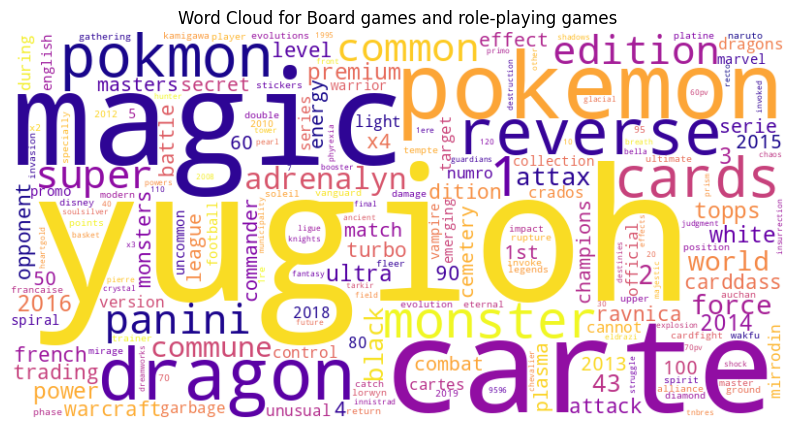

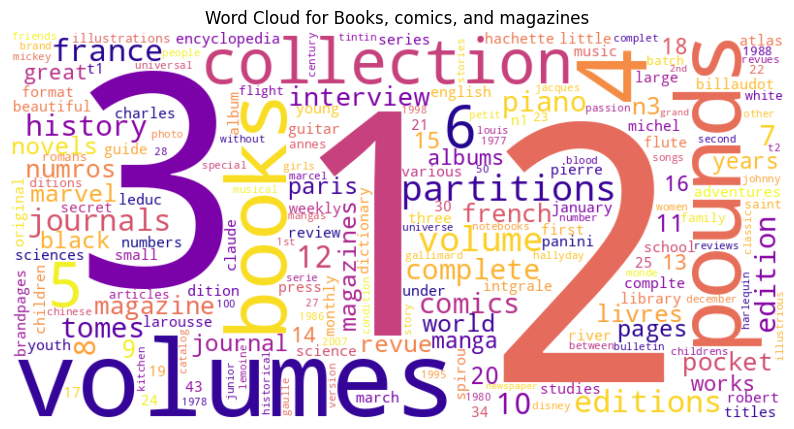

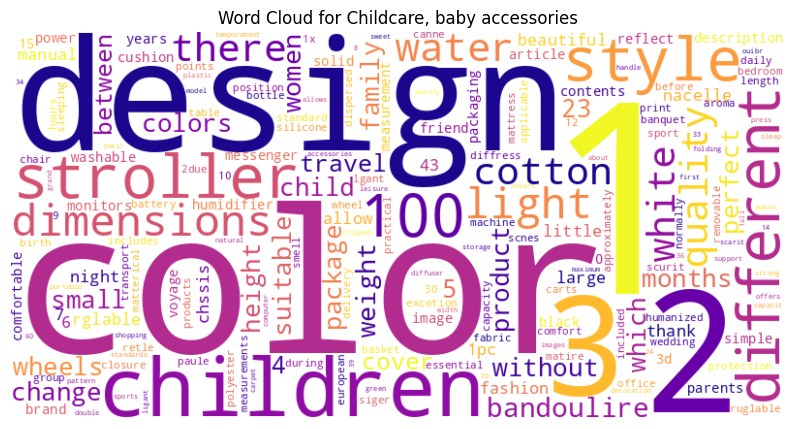

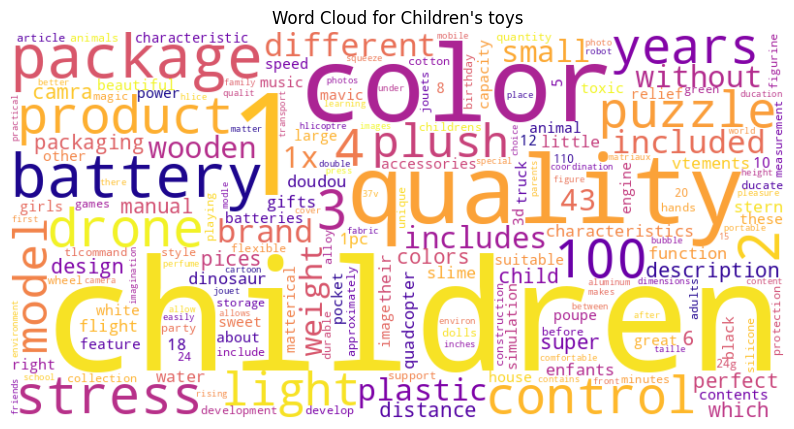

...

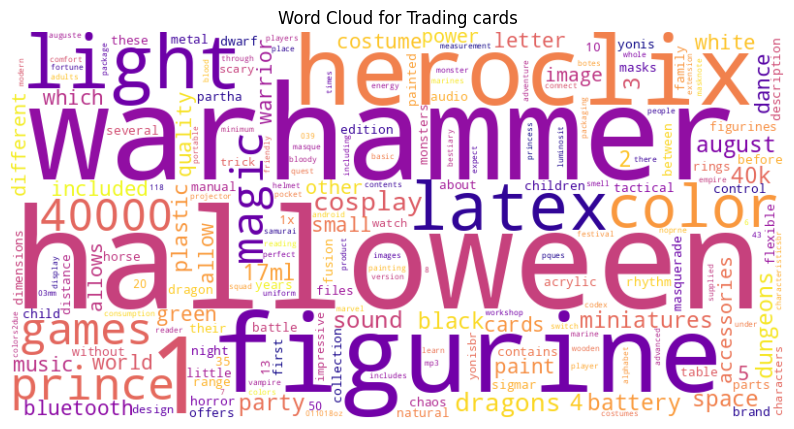

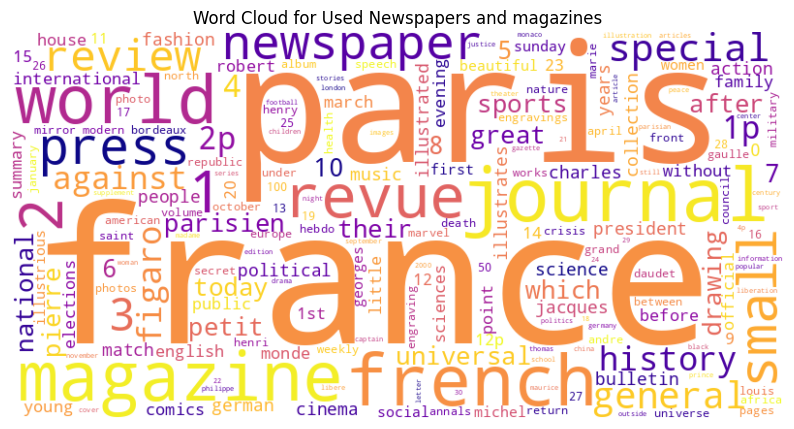

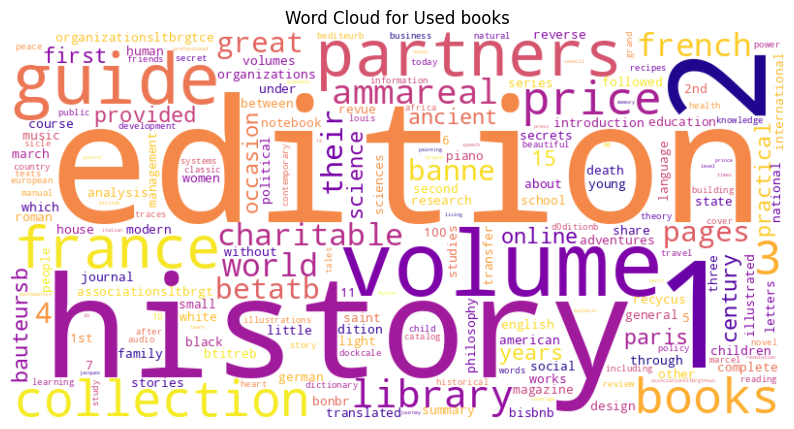

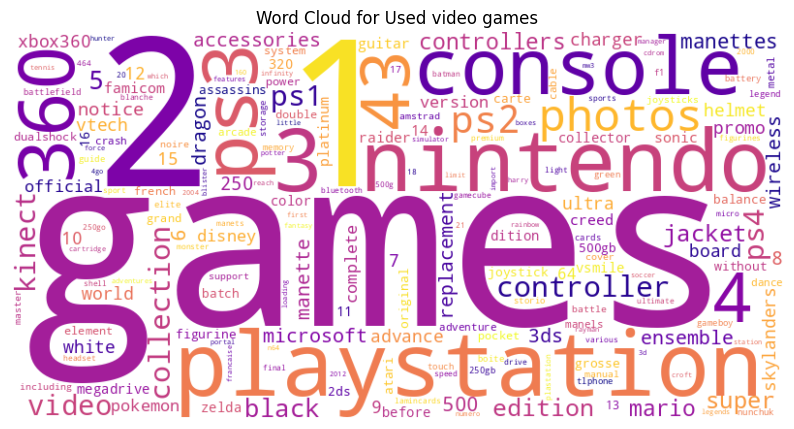

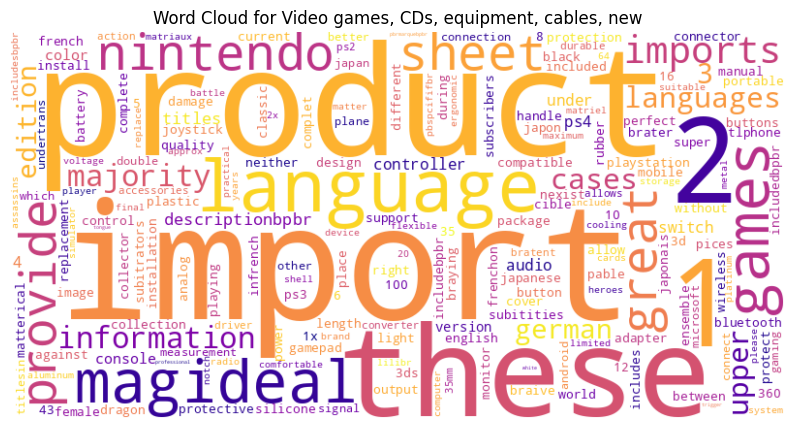

In [161]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def create_word_cloud(word_counts):
    for category, count in word_counts.items():
        plt.figure(figsize=(10,8))
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='plasma').generate_from_frequencies(count)
        plt.title(f'Word Cloud for {category}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.show()
        
create_word_cloud(word_frequencies)